In [1]:
library(stringr)
library(dplyr)
library(ggplot2)
library(lubridate)
library(ISOweek)
library(scales)
library(zoo)
library(tidyr)
library(quantreg)
library(splines)
library(pbs)
library(forecast)
require(RcppRoll)
library(fpp2)
library(xts)
# Read population data
raw_pop = read.csv("../data/pop_nor_07459_20220207.csv", skip=2, stringsAsFactors=FALSE, 
                  fileEncoding="latin1", sep=";")
# Read death
raw_deaths = read.csv("../data/death_nor_07995_20220207.csv", skip=2, stringsAsFactors=FALSE, 
                  fileEncoding="latin1", sep=";")
# Read vaccination data
raw = read.csv("../data/2022-02-07.antall-vaksinasjoner-etter-sykdom-fordelt-pa-dag-27.12.2020-05.02.2022.csv", sep=";", skip=1)
# Read covid death data
covid_deaths = read.csv("../data//Deaths_per_day_NRK_[download2022-02-16].csv", skip=1)

# Define functions
weighted_mean = function(x) {
    nas = is.na(x)
    w = c(0.25, 0.5, 0.25)
    if (all(nas)) {
        return(0)
    } else {
        w = w[!nas] / sum(w[!nas])
        return(sum(x[!nas] * w))
    }
}


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘lubridate’


The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union



Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Loading required package: SparseM


Attaching package: ‘SparseM’


The following object is masked from ‘package:base’:

    backsolve


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Loading required package: RcppRoll

── Attaching packages ─────────────────────────────────────────────────────────────────────────────── fpp2 2.4 ──

✔ fma       2.4     ✔ expsmooth 2.3




Attaching package: ‘xts’


The following objects are masked from ‘package:dplyr’:

    first, last




In [2]:
# Process input data
deaths = raw_deaths[raw_deaths$alder != "Alle aldre", ]
deaths$alder = as.numeric(str_extract(deaths$alder, "(\\d+)"))
deaths$uke = as.numeric(str_extract(deaths$uke, "(\\d+)"))
deaths = rename(deaths, age = alder)
deaths = rename(deaths, sex = kjønn)
deaths = rename(deaths, week = uke)
deaths$sex = as.factor(deaths$sex)
levels(deaths$sex) = list(b=deaths$sex[1]) # This assumes one gender only (both)
deaths = pivot_longer(deaths, 
                      cols=starts_with("X"), names_to="year", names_prefix="X", 
                      values_to="death")
deaths$year = as.numeric(deaths$year)
deaths$death[deaths$death == "."] = 0 # This is the NA string
deaths$death = as.numeric(deaths$death)
head(deaths)

pop = raw_pop[raw_pop$alder != "Alle aldre", ]
pop$alder = as.numeric(str_extract(pop$alder, "(\\d+)"))
pop = rename(pop, age = alder)
pop = rename(pop, sex = kjønn)
pop$sex = as.factor(pop$sex)
levels(pop$sex) = list(m="Menn", f="Kvinner")
pop = pivot_longer(pop, 
                      cols=starts_with("X"), names_to="year", names_prefix="X", 
                      values_to="pop")
pop$year = as.numeric(pop$year)
pop$pop = as.numeric(pop$pop)
tail(pop)

colnames(covid_deaths) = c("date", "deaths")
covid_deaths$date = dmy(covid_deaths$date)
covid_deaths$year = year(covid_deaths$date)
covid_deaths$week = ISOweek(covid_deaths$date)
covid_deaths$week = as.numeric(str_extract(str_extract(covid_deaths$week, "W(\\d*)"), "\\d+"))
covid_deaths$deaths = c(0, diff(covid_deaths$deaths))
cv_deaths = covid_deaths %>% group_by(week, year) %>% summarise(cv_deaths=sum(deaths), date=min(date))
head(cv_deaths)

# group vax data
vax = data.frame(date=raw[,1], dose_1=rowSums(raw[,2:4]), dose_2=rowSums(raw[,5:7]), dose_3=rowSums(raw[,8:10]))
vax$date = as.Date(vax$date, format="%d.%m.%Y")
vax_weekly = vax %>% group_by(ISOweek(date)) %>% 
    summarise(dose_1=sum(dose_1), dose_2=sum(dose_2), dose_3=sum(dose_3))

cum_vax_weekly = cbind(ISOweek2date(apply(vax_weekly[,1],1, paste, "1", sep="-")), cumsum(vax_weekly[, 2:4]))
colnames(cum_vax_weekly)[1] = "date"
head(cum_vax_weekly)


statistikkvariabel,sex,age,week,year,death
<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Døde,b,0,1,2000,6
Døde,b,0,1,2001,1
Døde,b,0,1,2002,3
Døde,b,0,1,2003,1
Døde,b,0,1,2004,4
Døde,b,0,1,2005,5


statistikkvariabel,region,sex,age,year,pop
<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>
Personer,0 Hele landet,f,105,2016,37
Personer,0 Hele landet,f,105,2017,44
Personer,0 Hele landet,f,105,2018,50
Personer,0 Hele landet,f,105,2019,52
Personer,0 Hele landet,f,105,2020,54
Personer,0 Hele landet,f,105,2021,75


`summarise()` has grouped output by 'week'. You can override using the `.groups` argument.



week,year,cv_deaths,date
<dbl>,<dbl>,<dbl>,<date>
1,2021,35,2021-01-04
1,2022,45,2022-01-03
2,2021,46,2021-01-11
2,2022,31,2022-01-10
3,2021,27,2021-01-18
3,2022,33,2022-01-17


In [3]:
# First lets check Gompertz law of mortality
# The ESP age groups
esp_group = cut(deaths$age, c(0,1,seq(5,95, 5), 200), right=FALSE)
esp_groups = levels(esp_group)

gdeaths = deaths %>% group_by(age = esp_group, year, week) %>% summarize(
    death = sum(death)
    )
tail(gdeaths)

`summarise()` has grouped output by 'age', 'year'. You can override using the `.groups` argument.



age,year,week,death
<fct>,<dbl>,<dbl>,<dbl>
"[95,200)",2022,48,0
"[95,200)",2022,49,0
"[95,200)",2022,50,0
"[95,200)",2022,51,0
"[95,200)",2022,52,0
"[95,200)",2022,53,0


In [4]:
pop_esp_group = cut(pop$age, c(0,1,seq(5,95, 5), 200), right=FALSE)
gpop = pop %>% group_by(age = pop_esp_group, year) %>% summarize(pop=sum(pop))
tail(gpop)

`summarise()` has grouped output by 'age'. You can override using the `.groups` argument.



age,year,pop
<fct>,<dbl>,<dbl>
"[95,200)",2016,9419
"[95,200)",2017,9872
"[95,200)",2018,10275
"[95,200)",2019,10420
"[95,200)",2020,10780
"[95,200)",2021,11055


In [5]:
# Remove gap year week 53
weeks = gdeaths$week
weeks[nchar(weeks) == 1] <- paste0("0", weeks[nchar(weeks) == 1])
week_pattern = paste(gdeaths$year, paste("W", weeks, sep=""), 
                   1, sep="-")
gdeaths$date = ISOweek2date(week_pattern)
gdeaths = gdeaths[gdeaths$week != 53,]
head(gdeaths)

age,year,week,death,date
<fct>,<dbl>,<dbl>,<dbl>,<date>
"[0,1)",2000,1,6,2000-01-03
"[0,1)",2000,2,5,2000-01-10
"[0,1)",2000,3,4,2000-01-17
"[0,1)",2000,4,10,2000-01-24
"[0,1)",2000,5,5,2000-01-31
"[0,1)",2000,6,7,2000-02-07


In [6]:
# we see almost 10% of rows have zero deaths. This is fixed by smoothing with a central
# kernel with weights 0.25, 0.5, 0.25 (rolling weekly)
merged = merge(gdeaths, gpop, by=c("year", "age"))
merged$end_age = gsub("\\[\\d+,", "", as.character(merged$age), perl=TRUE)
merged$end_age = as.numeric(gsub("\\)", "", as.character(merged$end_age), perl=TRUE)) - 1
merged$end_age[merged$end_age %in% c(199, 200)] = 105
merged$start_age = as.numeric(str_extract(merged$age, "\\d+"))
merged$avg_age = (merged$start_age + merged$end_age) / 2

sprintf("Fraction of data missing %.2f", dim(merged[merged$death==0,])[1] / dim(merged)[1])
# With a smoother we are down to 3%. This is managable
merged<-arrange(merged, age, date) %>%
       mutate(sdeaths=rollapply(death, 3, weighted_mean, align='center',fill=TRUE))
sprintf("Fraction of data missing after smoothing %.2f", dim(merged[merged$sdeaths==0,])[1] / dim(merged)[1])



[1] "Fraction of data missing 0.10"

[1] "Fraction of data missing after smoothing 0.03"

Warning message:
“Removed 1071 row(s) containing missing values (geom_path).”


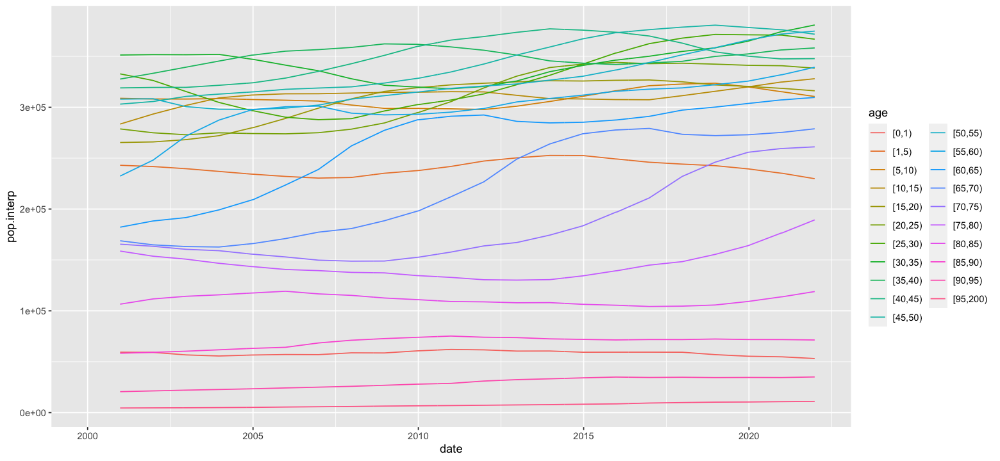

In [7]:
# Interpolate population data linearly between week 52 each year
options(repr.plot.width=13, repr.plot.height=6)
merged$pop[merged$week != 52] = NA
merged = merged %>%
  group_by(age) %>%
    arrange(age, date) %>%
    mutate(time=seq(1,n())) %>%
      mutate(pop.interp=approx(time,pop,time)$y) %>%
      select(-time)
ggplot(merged, aes(date, pop.interp, color=age)) + geom_line()

In [8]:
# Remove rows with with no population data (anything less than year 2001)
merged = subset(merged, sdeaths != 0 & !is.na(merged$pop.interp))
merged$mu = merged$sdeaths / merged$pop.interp
merged$lnmu = log(merged$sdeaths / merged$pop.interp)

head(merged)

year,age,week,death,date,pop,end_age,start_age,avg_age,sdeaths,pop.interp,mu,lnmu
<dbl>,<fct>,<dbl>,<dbl>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2000,"[0,1)",52,6,2000-12-25,59372,0,0,0,4.00,59372.00,6.737183e-05,-9.605284
2001,"[0,1)",1,1,2001-01-01,NA,0,0,0,4.25,59368.56,7.158671e-05,-9.544601
2001,"[0,1)",2,9,2001-01-08,NA,0,0,0,5.50,59365.12,9.264700e-05,-9.286714
2001,"[0,1)",3,3,2001-01-15,NA,0,0,0,4.25,59361.67,7.159502e-05,-9.544485
2001,"[0,1)",4,2,2001-01-22,NA,0,0,0,3.25,59358.23,5.475231e-05,-9.812691
2001,"[0,1)",5,6,2001-01-29,NA,0,0,0,4.25,59354.79,7.160332e-05,-9.544369


`summarise()` has grouped output by 'avg_age', 'year'. You can override using the `.groups` argument.

`geom_smooth()` using formula 'y ~ x'



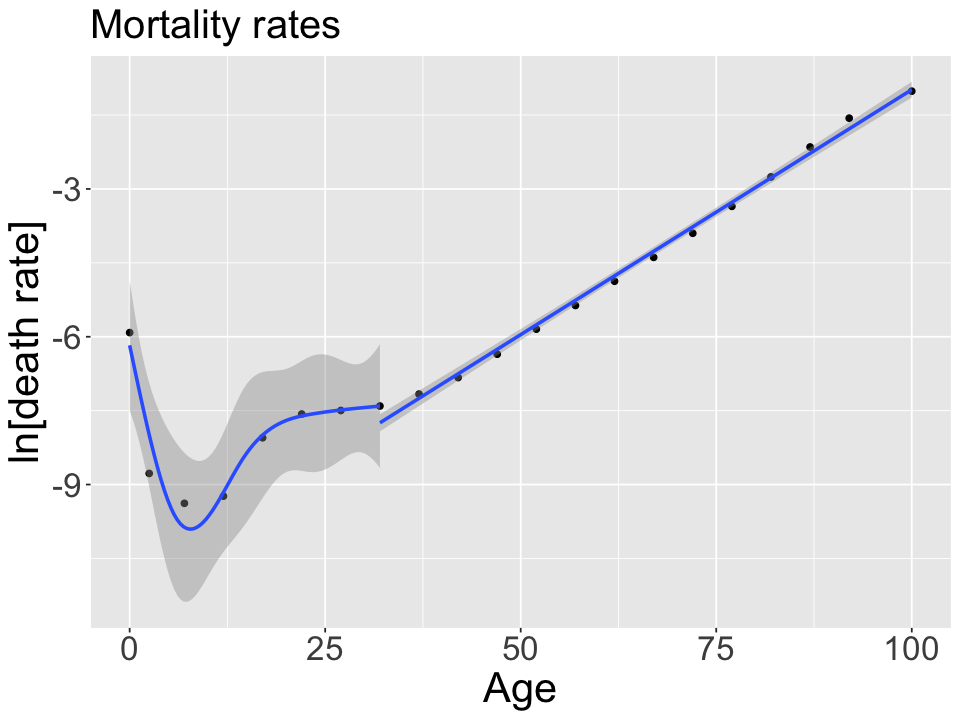

In [9]:
# Plot deaths rates by age
age_deaths = subset(merged, year < 2020) %>% group_by(avg_age, year) %>% summarize(sdeaths=sum(sdeaths, na.rm=TRUE), pop=pop.interp) %>% distinct()
age_deaths$lnmu = log(age_deaths$sdeaths / age_deaths$pop)
rates = age_deaths %>% dplyr::group_by(avg_age) %>% dplyr::summarise(mean_lnmu=mean(lnmu), sd_lnmu=sd(lnmu, na.rm=TRUE))
rates = rename(rates, age = avg_age)

# We see that the relationship is simple after 30 years of age. Before we need to be careful.
options(repr.plot.width=8, repr.plot.height=6)
a = ggplot(rates, aes(age, mean_lnmu, weight=1/sd_lnmu))
a + geom_point() + geom_smooth(data=subset(rates, age > 30), method = "lm", se=TRUE) +
geom_smooth(data=subset(rates, age <= 35), method = "lm", formula=y~ns(x, df=4), se=TRUE) +
labs(x = "Age", y = "ln[death rate]", title="Mortality rates") +
theme(title=element_text(size=20), axis.text=element_text(size=20), axis.title=element_text(size=25))

In [216]:
?facet_wrap

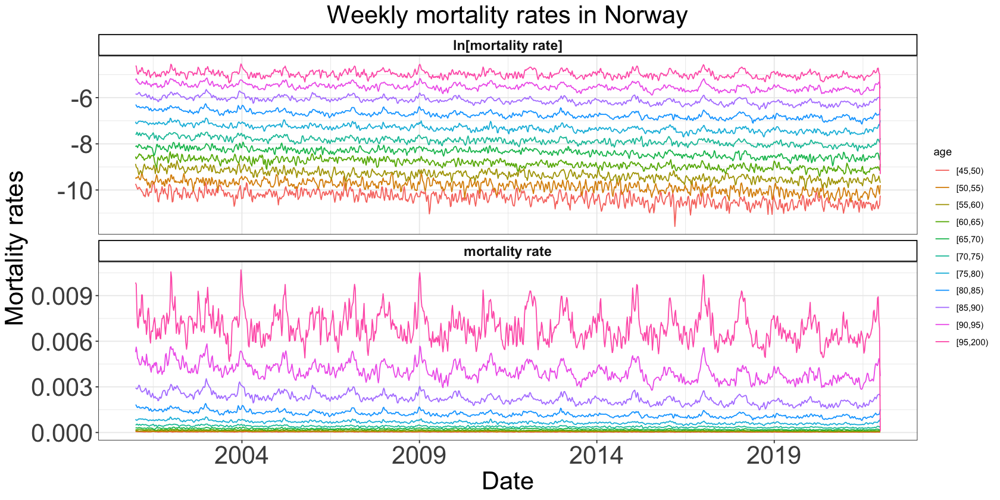

In [246]:
# Plot mortality and log(mortality), notice the changing standard deviation vs age group.
# We can group 65+ together but lower than that is risky.
# We also notice that there is an unrealistic drop the last week of 2021,
# possibly due to data collection being inclomplete.
# Note also that the variance increases as the rates increase, as it's a poisson process. 
# Thus, we work with log transformed data as this is homoscedastic in both time and rates
n_groups = length(esp_groups)
subset = subset(merged, age %in% esp_groups[(n_groups-10):n_groups] & year > 2000)
subset = pivot_longer(subset, c("mu", "lnmu"), values_to="rates", names_to=c("type"))
options(repr.plot.width=14, repr.plot.height=7)
n_groups = length(esp_groups)
a = ggplot(subset, aes(x=date, y=rates, color=age))
a + geom_line() + facet_wrap(~type, scales="free_y", ncol=1, labeller = labeller(type = 
    c("lnmu" = "ln[mortality rate]",
      "mu" = "mortality rate")
  )) +
theme_bw() +
labs(x = "Date", y = "Mortality rates", title="Weekly mortality rates in Norway") +
theme(plot.title=element_text(size=25, hjust=.5), axis.text=element_text(size=25), 
      axis.title=element_text(size=25),
     strip.background = element_rect(
     color="black", fill="white", size=1., linetype="solid"
     ),
     strip.text.x = element_text(
        size = 14, face = "bold"
        ))  +
scale_x_date(date_breaks = "5 years", labels = scales::label_date_short())
ggsave("../figures/norway_mortality_rates.pdf", width=14, height=6)

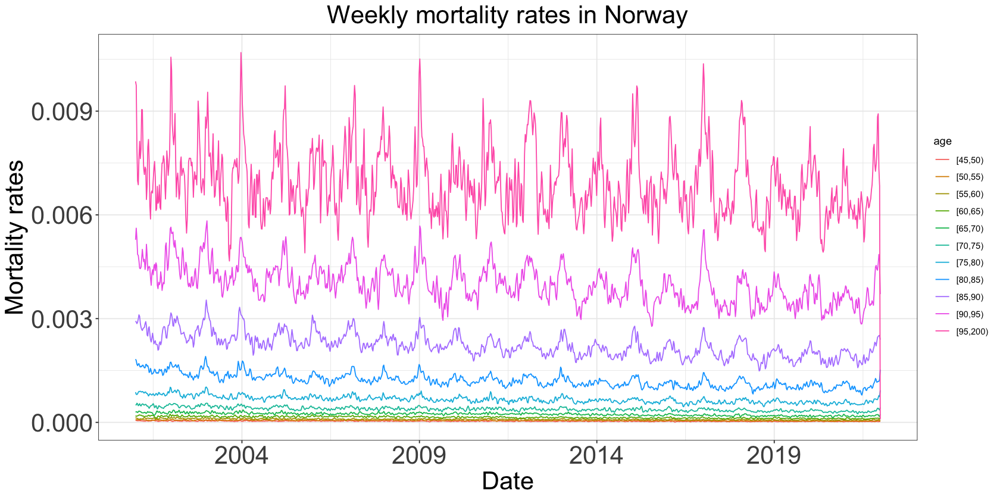

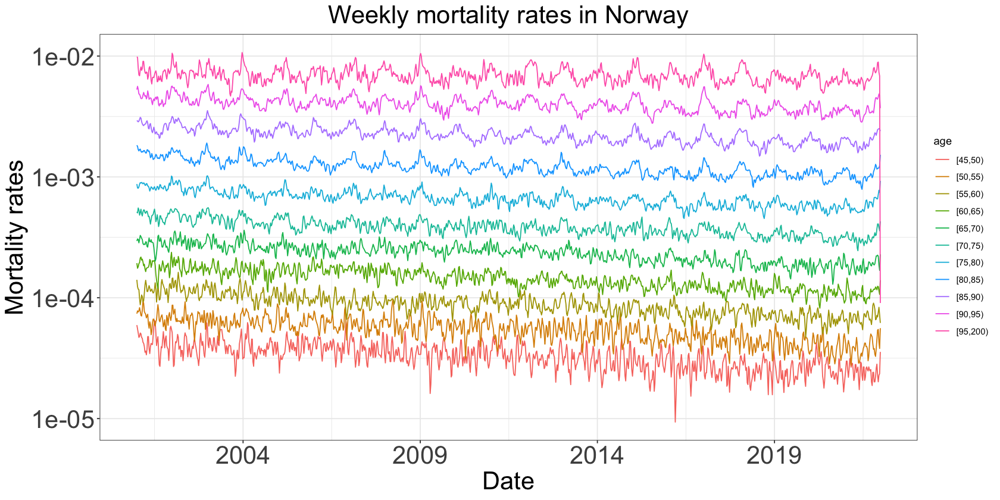

In [222]:
# Plot mortality and log(mortality), notice the changing standard deviation vs age group.
# We can group 65+ together but lower than that is risky.
# We also notice that there is an unrealistic drop the last week of 2021,
# possibly due to data collection being inclomplete.
# Note also that the variance increases as the rates increase, as it's a poisson process. 
# Thus, we work with log transformed data as this is homoscedastic in both time and rates
n_groups = length(esp_groups)
subset = subset(merged, age %in% esp_groups[(n_groups-10):n_groups] & year > 2000)
options(repr.plot.width=14, repr.plot.height=7)
n_groups = length(esp_groups)
a = ggplot(subset, aes(x=date, y=mu, color=age))
a + geom_line() + 
theme_bw() +
labs(x = "Date", y = "Mortality rates", title="Weekly mortality rates in Norway") +
theme(plot.title=element_text(size=25, hjust=.5), axis.text=element_text(size=25), axis.title=element_text(size=25)) +
scale_x_date(date_breaks = "5 years", labels = scales::label_date_short())

a = ggplot(subset, aes(x=date, y=mu, color=age))
a + geom_line() + 
theme_bw() +
labs(x = "Date", y = "Mortality rates", title="Weekly mortality rates in Norway") +
theme(plot.title=element_text(size=25, hjust=.5), axis.text=element_text(size=25), axis.title=element_text(size=25)) +
scale_x_date(date_breaks = "5 years", labels = scales::label_date_short()) +
scale_y_continuous(trans='log10')
                   

In [11]:
esp_pop = c(1000, 4000, 5500, 5500, 5500, 6000, 6000, 6500, 7000, 
            7000, 7000, 7000, 6500, 6000, 5500, 5000, 4000, 2500, 1500, 800, 200)
esp_pop = data.frame(age=esp_groups, esp_pop=esp_pop)

norm = merge(merged, esp_pop, by="age")
norm$deaths_norm = norm$mu * norm$esp_pop
head(norm)

,age,year,week,death,date,pop,end_age,start_age,avg_age,sdeaths,pop.interp,mu,lnmu,esp_pop,deaths_norm
,<fct>,<dbl>,<dbl>,<dbl>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,"[0,1)",2000,52,6,2000-12-25,59372,0,0,0,4.00,59372.00,6.737183e-05,-9.605284,1000,0.06737183
2,"[0,1)",2001,1,1,2001-01-01,NA,0,0,0,4.25,59368.56,7.158671e-05,-9.544601,1000,0.07158671
3,"[0,1)",2001,2,9,2001-01-08,NA,0,0,0,5.50,59365.12,9.264700e-05,-9.286714,1000,0.09264700
4,"[0,1)",2001,3,3,2001-01-15,NA,0,0,0,4.25,59361.67,7.159502e-05,-9.544485,1000,0.07159502
5,"[0,1)",2001,4,2,2001-01-22,NA,0,0,0,3.25,59358.23,5.475231e-05,-9.812691,1000,0.05475231
6,"[0,1)",2001,5,6,2001-01-29,NA,0,0,0,4.25,59354.79,7.160332e-05,-9.544369,1000,0.07160332


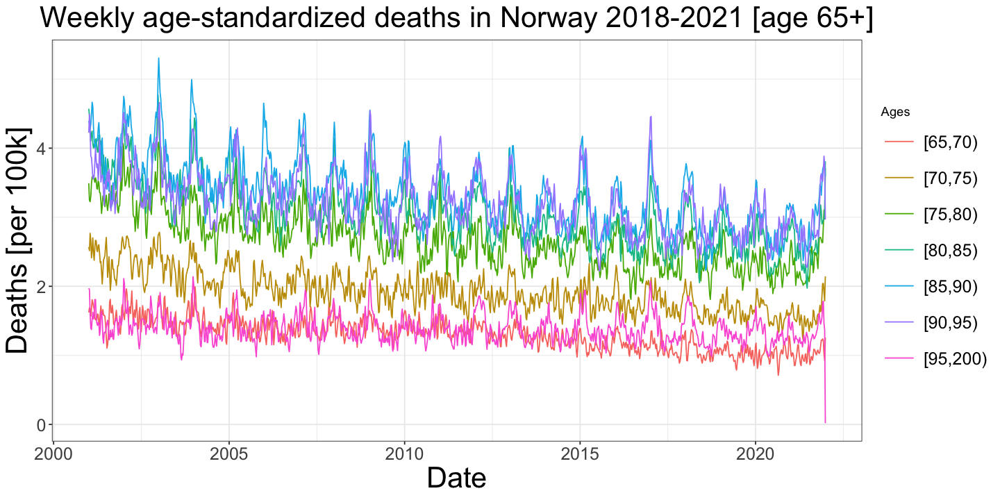

In [247]:
options(repr.plot.width=12, repr.plot.height=6)
n_groups = length(esp_groups)
subset = subset(norm, age %in% esp_groups[(n_groups-6):n_groups] & year > 2000)
a = ggplot(subset, aes(x=date, y=deaths_norm, color=age))
a + geom_line() +
theme(title=element_text(size=20), axis.text=element_text(size=20), axis.title=element_text(size=25)) +
labs(x = "Date", y = "Deaths [per 100k]", title="Weekly age-standardized deaths in Norway 2018-2021 [age 65+]") +
theme_bw() +
theme(plot.title=element_text(size=25, hjust=.5), 
      axis.text=element_text(size=15), 
      legend.text=element_text(size=15), 
      axis.title=element_text(size=25), 
      legend.key.size=unit(1.1, "cm")) +
scale_color_discrete("Ages")
ggsave("../figures/norway_age-std_deaths.pdf", width=14, height=7)

In [40]:
# Sum all deaths in specified age bracket
# ESP combined deaths
FIXED_POP_NUMBER = 100000
old_deaths = subset(norm, start_age > 64) %>% group_by(week, year) %>% 
    summarise(deaths=sum(deaths_norm) / sum(esp_pop) * FIXED_POP_NUMBER, 
              pop.interp=sum(pop.interp),
              sum_esp_pop=sum(esp_pop),
              lnmu=log(sum(deaths_norm) / sum(esp_pop)),
              date=date) %>% distinct()
old_deaths$days = old_deaths$date - old_deaths$date[1]
tail(old_deaths)

`summarise()` has grouped output by 'week', 'year'. You can override using the `.groups` argument.



week,year,deaths,pop.interp,sum_esp_pop,lnmu,date,days
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<date>,<drtn>
52,2016,98.43355,855100,19500,-6.923544,2016-12-26,5838 days
52,2017,90.58457,874822,19500,-7.006642,2017-12-25,6202 days
52,2018,84.48864,896425,19500,-7.076308,2018-12-24,6566 days
52,2019,78.41427,918841,19500,-7.150919,2019-12-23,6930 days
52,2020,80.33281,941816,19500,-7.126747,2020-12-21,7294 days
52,2021,89.71245,965742,19500,-7.016316,2021-12-27,7665 days


In [74]:
# Assume all covid deaths happen to the 65+ group
# Make sure to normalize covid deaths to interpolated population
old_norm = merge(old_deaths, cv_deaths[,c("cv_deaths", "week", "year")], by=c("week", "year"), all.x=TRUE)
old_norm$cv_deaths[is.na(old_norm$cv_deaths)] = 0
old_norm$cv_deaths = old_norm$cv_deaths / old_norm$pop.interp * FIXED_POP_NUMBER
old_norm$non_cv_deaths = old_norm$deaths - old_norm$cv_deaths
old_norm$ln_non_cv_deaths = log(old_norm$non_cv_deaths / FIXED_POP_NUMBER)
tail(old_norm)

,week,year,deaths,pop.interp,sum_esp_pop,lnmu,date,days,cv_deaths,non_cv_deaths,ln_non_cv_deaths
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<date>,<drtn>,<dbl>,<dbl>,<dbl>
1088,52,2016,98.43355,855100,19500,-6.923544,2016-12-26,5838 days,0.000000,98.43355,-6.923544
1089,52,2017,90.58457,874822,19500,-7.006642,2017-12-25,6202 days,0.000000,90.58457,-7.006642
1090,52,2018,84.48864,896425,19500,-7.076308,2018-12-24,6566 days,0.000000,84.48864,-7.076308
1091,52,2019,78.41427,918841,19500,-7.150919,2019-12-23,6930 days,0.000000,78.41427,-7.150919
1092,52,2020,80.33281,941816,19500,-7.126747,2020-12-21,7294 days,1.805023,78.52779,-7.149473
1093,52,2021,89.71245,965742,19500,-7.016316,2021-12-27,7665 days,4.970272,84.74218,-7.073312


In [239]:
get_percentage = function(x) {
    (exp(x) - 1) * 100
}
mortality_fit = function(data, response="lnmu", start_year = 2012) {
    train = subset(data, year < 2020 & year >= start_year & year(date) >= start_year) %>% distinct()
    all = subset(data, year >= start_year & year(date) >= start_year) %>% distinct()

    df = 7 # Degrees of freedom for spline fit
    # Fit a quantile regression
    yearly.fit = rq(train[, response] ~ date, data=train)

    # Use same extrapolation in 2021 as 2020 to avoid too much extrapolation
    non_extrp_date = all$date
    non_extrp_date[all$year >= 2020] = rep(as.Date("2020-01-01", "%Y-%m-%d"), sum(all$year >= 2020))
    all$yearly = predict(yearly.fit, newdata=data.frame(date=non_extrp_date))
    train$yearly = predict(yearly.fit, newdata=train)
    all$res.yearly = all[, response] - all$yearly
    train$res.yearly = train[, response] - train$yearly
    weekly.fit = rq(res.yearly ~ pbs(week, df=df), data=train)
    all$weekly = predict(weekly.fit, newdata=all)
    train$weekly = predict(weekly.fit, newdata=train)
    train$centered = train$res.yearly - train$weekly
    all$centered = all$res.yearly - all$weekly

    # Get confidence intervals
    rq.fit.low = rq(centered ~ pbs(week, df=df), data=train, tau=0.025)
    rq.fit.high = rq(centered ~ pbs(week, df=df), data=train, tau=0.975)
    train$centered_high = predict(rq.fit.high, newdata=train)
    train$centered_low = predict(rq.fit.low, newdata=train)
    all$centered_high = predict(rq.fit.high, newdata=all)
    all$centered_low = predict(rq.fit.low, newdata=all)
    test = subset(all, year(date) == 2021)
    # Test that the residuals are within the confidence band with desired frequency
    frac_outside = sum(train$centered < train$centered_low | train$centered > train$centered_high) / nrow(train)
    frac_outside_test = sum(test$centered < test$centered_low | test$centered > test$centered_high) / nrow(test)
    frac_over_test = sum(test$centered > test$centered_high) / nrow(test)
    print(sprintf("Fraction of observations outside confidence band in pre-2020: %.3f", frac_outside))
    print(sprintf("Fraction of observations outside confidence band in 2021: %.3f", frac_outside_test))
    print(sprintf("Fraction of observations over confidence band in 2021: %.3f", frac_over_test))
    list(all=all, train=train)
}

[1] "Fraction of observations outside confidence band in pre-2020: 0.042"
[1] "Fraction of observations outside confidence band in 2021: 0.558"
[1] "Fraction of observations over confidence band in 2021: 0.327"


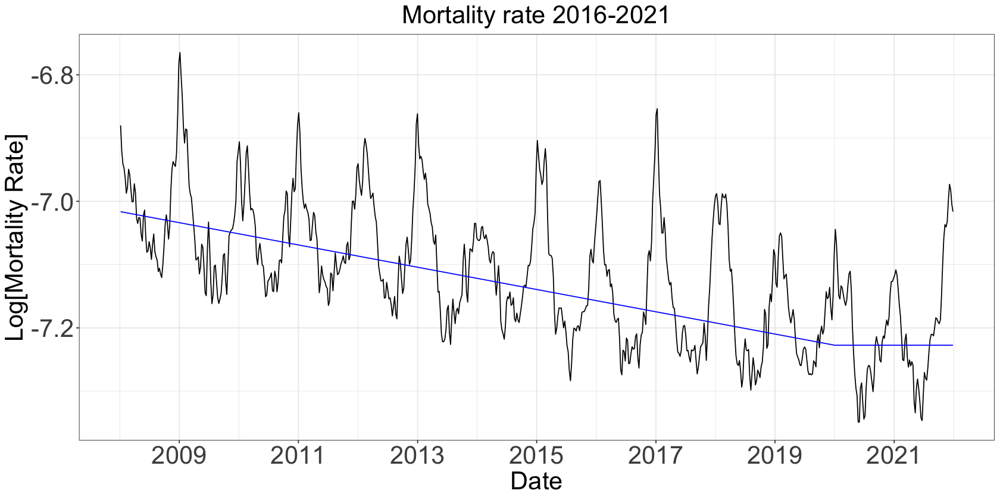

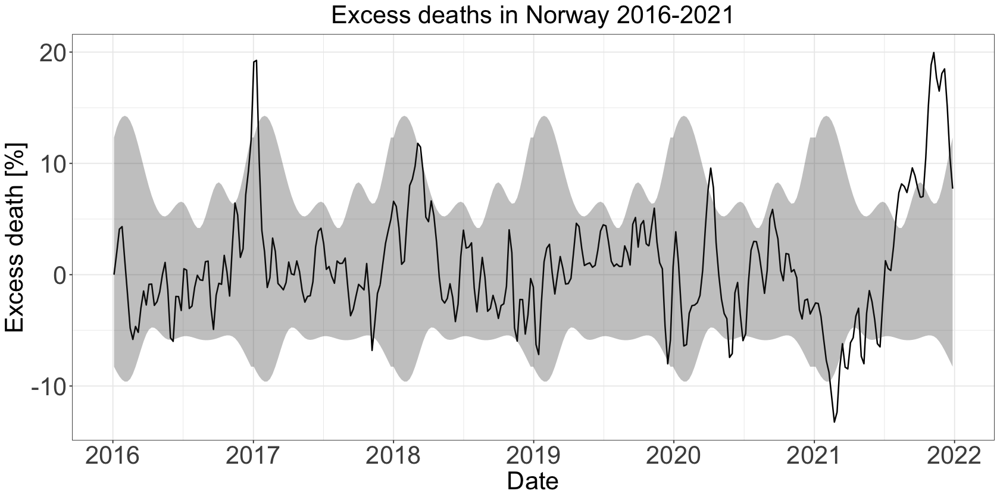

In [240]:
# Get detrended and centered with a seasonal trend based on periodic splines with 6 degrees of freedom
options(repr.plot.width=14, repr.plot.height=7)

out = mortality_fit(old_norm, response="lnmu", start_year=2008)
all = out[[1]]
train = out[[2]]

# Plot linear trend
a = ggplot(all, aes(x=date, y=lnmu))
a + geom_line() + geom_line(aes(y=yearly), color="blue") + 
theme(title=element_text(size=20), axis.text=element_text(size=20), axis.title=element_text(size=25)) +
theme_bw() +
labs(x = "Date", y = "Log[Mortality Rate]", title="Mortality rate 2016-2021")+
theme(plot.title=element_text(size=25, hjust=.5), axis.text=element_text(size=25), axis.title=element_text(size=25))+
scale_x_date(date_breaks = "2 years", labels = scales::label_date_short())

# Plot excess
ggplot(subset(all, year(date) >= 2016), aes(date, get_percentage(centered)) ) + 
geom_line(size=0.7) + 
geom_ribbon(aes(ymin=get_percentage(centered_low), ymax=get_percentage(centered_high)), alpha=0.3) +
theme_bw() +
labs(x = "Date", y = "Excess death [%]", title="Excess deaths in Norway 2016-2021") +
theme(plot.title=element_text(size=25, hjust=.5), axis.text=element_text(size=25), axis.title=element_text(size=25)) +
scale_x_date(date_breaks = "1 year", labels = scales::label_date_short())

year,frac_outside,frac_over
<dbl>,<dbl>,<dbl>
2008,0.00000000,0.00000000
2009,0.15686275,0.01960784
2010,0.07692308,0.03846154
2011,0.03846154,0.01923077
2012,0.01886792,0.01886792
2013,0.01923077,0.00000000
2014,0.01923077,0.01923077
2015,0.03921569,0.00000000
2016,0.01923077,0.00000000


[1] "P-Values for anomalous years (outside 95th C.I.), 2019: 0.999, 2020: 0.000, 2021: 0.000"

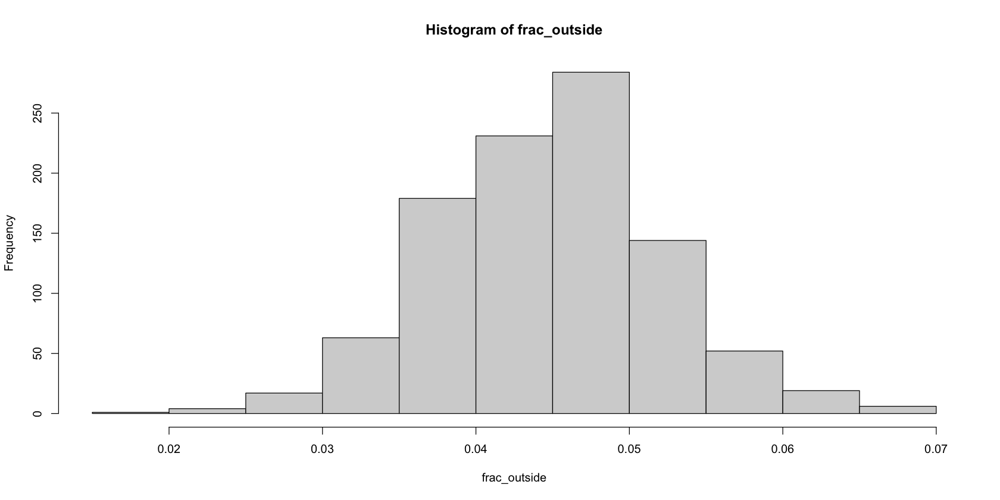

In [188]:
# How to calculate significance:
# We know that the median has an equal number of observations above vs. below the estimate.
# So a null hypothesis would be that each year sees an equal number of observations outside confidence intervals.
# We can resample the residuals (for the training period) and compute the null distribution, then compare 
# each years residuals with this distribution.
# To preserve temporal structure we resample in blocks of 5
block_size = 10
n = dim(train)[1]
B = 1000
frac_outside = rep(0, B)
for (b in 1:B) {
    idx_start = sample(1:(n))[1:floor(n / block_size)]
    idx = idx_start
    for (i in 1:(block_size - 1)) {
        idx = rbind(idx, idx_start + i)
    }
    star = train[pmin(c(idx), rep(n, length(idx))),] # make sure we are inside index limits
    frac_outside[b] = sum(star$centered >= star$centered_high | star$centered <= star$centered_low) / length(c(idx))
}
annual_frac_outside = all %>% group_by(year=year(date)) %>% 
    summarize(frac_outside=sum(centered > centered_high | centered < centered_low) / length(centered),
             frac_over=sum(centered > centered_high) / length(centered))
annual_frac_outside
hist(frac_outside)

# Calculate p-values, 2019 is not significant for alpha < 0.027, 2020 and 2021 are both significant.
p_2019 = sum(frac_outside > annual_frac_outside[annual_frac_outside$year==2019,]$frac_outside) / length(frac_outside)
p_2020 = sum(frac_outside > annual_frac_outside[annual_frac_outside$year==2020,]$frac_outside) / length(frac_outside)
p_2021 = sum(frac_outside > annual_frac_outside[annual_frac_outside$year==2021,]$frac_outside) / length(frac_outside)
sprintf("P-Values for anomalous years (outside 95th C.I.), 2019: %.3f, 2020: %.3f, 2021: %.3f", p_2019, p_2020, p_2021)

Warning message in ks.test(exp(train$centered) - 1, "pnorm"):
“ties should not be present for the Kolmogorov-Smirnov test”



	One-sample Kolmogorov-Smirnov test

data:  exp(train$centered) - 1
D = 0.46106, p-value < 2.2e-16
alternative hypothesis: two-sided


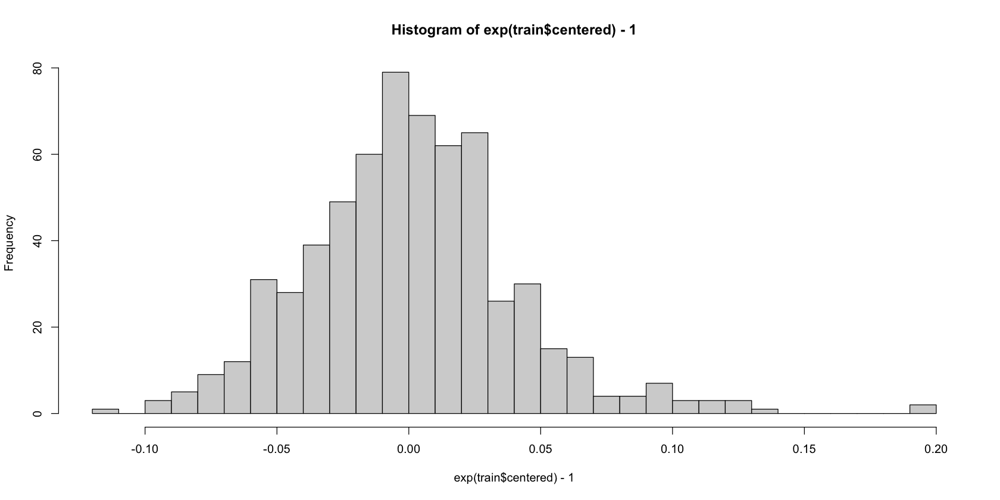

In [189]:
# The residuals is not normal. They have a heavier tail.
hist(exp(train$centered) - 1, breaks=30)
ks.test(exp(train$centered) - 1, 'pnorm') 

Series: xts(exp(train$centered), order.by = train$date) 
ARIMA(3,0,4) with non-zero mean 

Coefficients:
         ar1      ar2     ar3      ma1      ma2     ma3     ma4    mean
      2.0644  -1.3105  0.2099  -0.2234  -1.2852  0.2281  0.5164  1.0009
s.e.  0.1143   0.1911  0.0820   0.1078   0.0624  0.0993  0.0542  0.0039

sigma^2 = 0.0002242:  log likelihood = 1735.2
AIC=-3452.4   AICc=-3452.1   BIC=-3412.49

Warning message in modeldf.default(object):
“Could not find appropriate degrees of freedom for this model.”


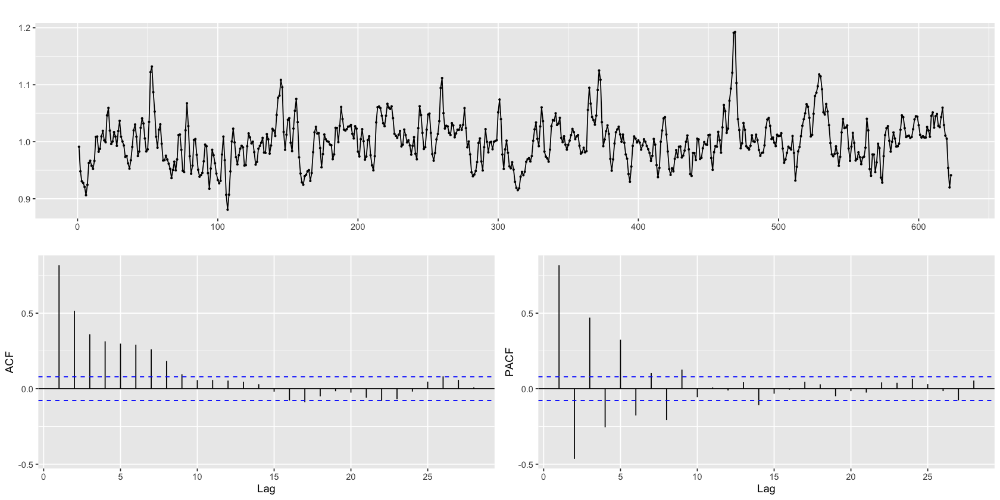


	One-sample Kolmogorov-Smirnov test

data:  fit$res
D = 0.48347, p-value < 2.2e-16
alternative hypothesis: two-sided


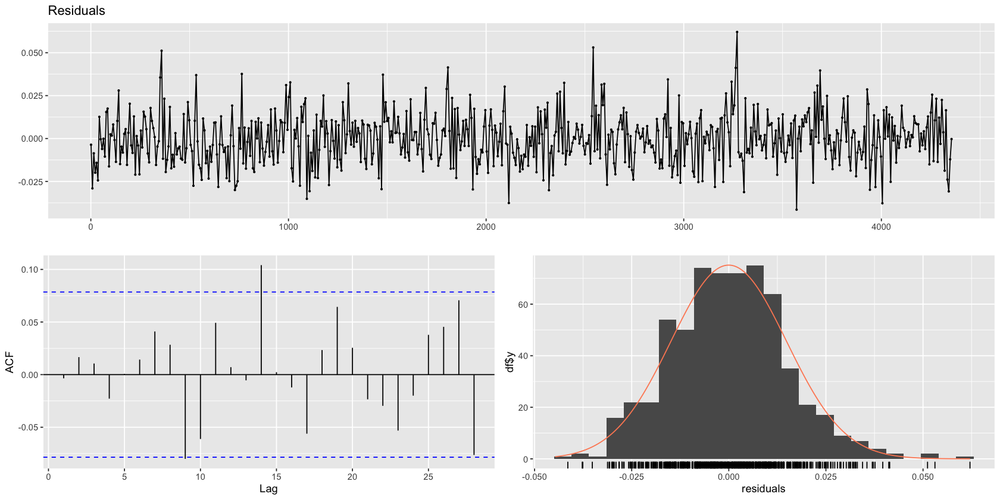

In [190]:
# Appendix A: Arima model on residuals. We see that residuals follow a complex pattern, 
# justifying the block bootstrap
fit = auto.arima(xts(exp(train$centered), order.by=train$date))
fit
xts(exp(train$centered), order.by=train$date) %>% ggtsdisplay()
checkresiduals(fit$res)
ks.test(fit$res, "pnorm")

Warning message:
“Removed 155 row(s) containing missing values (geom_path).”
Warning message:
“Removed 155 row(s) containing missing values (geom_path).”


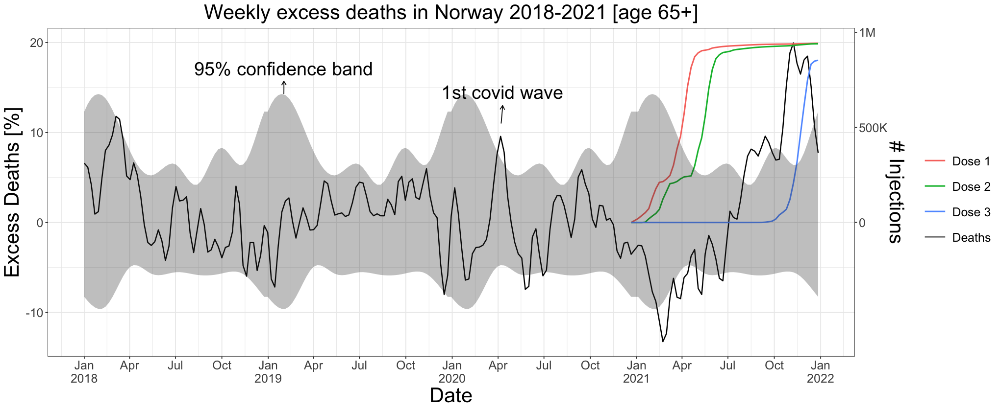

In [191]:
# Superpose vaccination data
options(repr.plot.width=17, repr.plot.height=7)
# Normalize vax data by max # injections
all$p_centered = get_percentage(all$centered)
all$p_centered_low = get_percentage(all$centered_low)
all$p_centered_high = get_percentage(all$centered_high)
range = range(all$p_centered)
max_vax = max(cum_vax_weekly[,2:4])
colmax = apply(cum_vax_weekly[,2:4], 2, function(x) x / max_vax * range[2])
norm_vax = data.frame(date=cum_vax_weekly$date, colmax)
norm_vax = na.omit(norm_vax)
norm_vax = pivot_longer(data.frame(norm_vax), c(2:4), values_to="n_vax", names_to="n_dose")
               
all_vax = merge(all, norm_vax, all.x=TRUE, by="date") %>% distinct()
max_p_cent_high = max(all$p_centered_high)
# all_vax = na.omit(all_vax)
ggplot(subset(all_vax, year(date) > 2017), aes(date, p_centered)) + 
geom_line(aes(y=p_centered), size=0.7) + 
geom_line(aes(y=n_vax, color=n_dose), size=0.85) + 
scale_y_continuous(
        sec.axis=sec_axis(~. * max_vax / range[2], 
                      breaks=c(0, 5e5,1e6),
                    labels = scales::label_number_si(),
name="# Injections")) +
geom_ribbon(aes(ymin=p_centered_low, ymax=p_centered_high), alpha=0.3) +
labs(x = "Date", y = "Excess Deaths [%]", title="Weekly excess deaths in Norway 2018-2021 [age 65+]") +
theme_bw() +
theme(plot.title=element_text(size=25, hjust=.5), 
      axis.text=element_text(size=15), 
      legend.text=element_text(size=15), 
      axis.title=element_text(size=25), 
      legend.key.size=unit(1.1, "cm")) +
scale_color_discrete("", labels=c("Dose 1", "Dose 2", "Dose 3", "Deaths")) + 
annotate(
    geom = "curve", x = as.Date("2020-04-07"), y = 11, xend = as.Date("2020-04-10"), yend = 13, 
    curvature = .01, arrow = arrow(length = unit(2, "mm"))
  ) +
  annotate(geom = "text", x = as.Date("2020-04-10"), y = 14.5, label = "1st covid wave", hjust = "center", size=8) +
annotate(
    geom = "curve", x = as.Date("2019-02-01"), y = max_p_cent_high, 
    xend = as.Date("2019-02-01"), yend = max_p_cent_high*1.1, 
    curvature = .01, arrow = arrow(length = unit(2, "mm"))
  ) +
  annotate(geom = "text", x = as.Date("2019-02-01"), y = max_p_cent_high*1.2, label = "95% confidence band", hjust = "center", size=8) +

scale_x_date(date_breaks = "3 months", labels = scales::label_date_short())
               
ggsave("../figures/norway_excess_deaths_pois.pdf", width=17, height=8)
               

0.8517622,0.9128585,0.9580248,0.9785195,0.9604580,0.9678416,0.9684083,0.9766483,0.9925267,0.9949224,1.0053351,1.0473208
1.0654551,1.1097992,1.1394278,1.1630020,1.1479550,1.1587949,1.1766805,1.1812215,1.1497838,1.1791883,1.2049239,1.1938739
0.8825120,0.9258690,0.9587594,0.9610329,0.9325748,0.9131860,0.9131194,0.9219401,0.9368633,0.9371592,0.9721705,0.9665795
0.8287158,0.8336440,0.8435576,0.8401059,0.8537937,0.8574935,0.8797696,0.8863650,0.8511822,0.8772244,0.9465108,0.9594200
0.9797038,0.9701192,0.9627292,0.9532639,0.9116371,0.8932951,0.8989356,0.9024267,0.9557740,0.9457099,0.9379617,0.9090363
0.8341367,0.9251658,0.9685697,0.9854151,0.9691668,0.9681515,0.9666005,0.9686874,0.9741373,0.9706831,1.0264325,1.0568613


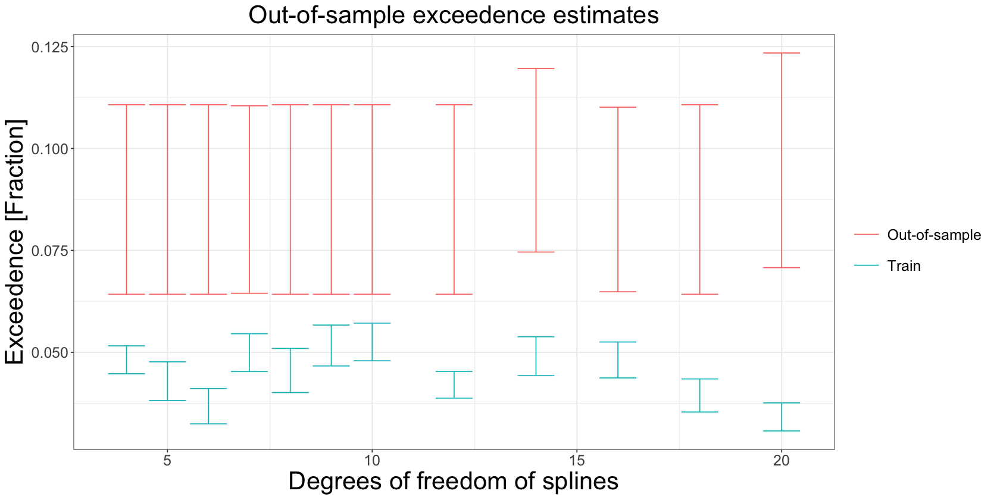

In [202]:
# Cross-validate to find best smoothing parameter by minimizing out-of-sample 
# deviation from estimated exceedence. I.e. for a 95% confidence band, we will expect 
# 5% of out-of-sample estimates to be outside this band. We thus choose the smallest number 
# of parameters that get us there.
# Conclusion: The predictive power is not dependent on degrees of freedom of smoothing
alpha = 0.05 # Confidence interval
years = unique(year(train$date))
dfs = c(4:10, 12, 14, 16, 18, 20)
n_years = length(years)
n_dfs = length(dfs)
te_hat = matrix(0, n_years, n_dfs)
tr_hat = matrix(0, n_years, n_dfs)
sd_ratio_hat = matrix(0, n_years, n_dfs)
out = vector(mode="list", length=n_years)
for (i in 1:n_years) {
    out[[i]] = vector(mode="list", length=n_dfs)
    for (j in 1:n_dfs) {
        m_year = years[i]
        tr = subset(train, year != m_year)
        te = subset(train, year == m_year)
        tr.fit = rq(res.yearly ~ pbs(week, df=dfs[j]), data=tr)
        tr$fit = tr.fit$fit
        te$fit = predict(tr.fit, newdata=te)
        tr$centered = tr.fit$res
        te$centered = te$res.yearly - predict(tr.fit, newdata=te)
        tr.fit.high = rq(centered ~ pbs(week, df=df), data=tr, tau=1-alpha/2)
        tr.fit.low = rq(centered ~ pbs(week, df=df), data=tr, tau=alpha/2)
        tr$high = tr.fit.high$fit
        tr$low = tr.fit.low$fit
        te$high = predict(tr.fit.high, newdata=te)
        te$low = predict(tr.fit.low, newdata=te)
        out[[i]][[j]] = rbind(tr,te)
        sd_ratio_hat[i, j] = sd(te$centered) / sd(tr$centered)
        tr_hat[i, j] = (sum(tr$low > tr$centered | tr$high < tr$centered) / nrow(tr))
        te_hat[i, j] = (sum(te$low > te$centered | te$high < te$centered) / nrow(te))
    }
}
head(sd_ratio_hat)
te_oos_error = data.frame(mean=apply(te_hat, 2, median), sd=apply(te_hat, 2, sd)/sqrt(n_years))
tr_oos_error = data.frame(mean=apply(tr_hat, 2, median), sd=apply(tr_hat, 2, sd)/sqrt(n_years))
oos_error = rbind(train=tr_oos_error, test=te_oos_error)
oos_error$data_set = rownames(oos_error)
oos_error$data_set = gsub("\\.*\\d", "", oos_error$data_set)
ggplot(oos_error, 
       aes(x=rep(dfs, 2), mean, ymin=mean-sd, ymax=mean+sd, color=data_set)) + geom_errorbar() +
theme_bw() +
theme(plot.title=element_text(size=25, hjust=.5), 
      axis.text=element_text(size=15), 
      legend.text=element_text(size=15), 
      axis.title=element_text(size=25), 
      legend.key.size=unit(1.1, "cm")) + 
labs(y="Exceedence [Fraction]", x="Degrees of freedom of splines", title="Out-of-sample exceedence estimates") +
scale_color_discrete("", labels=c("Out-of-sample", "Train"))
ggsave("../figures/cv_pois_s2008.pdf", width=12, height=6)

In [185]:
# The RSS is only a few percent different between out-of sample and in-sample.
colMeans(sd_ratio_hat) - 1

[1] 0.001834057 0.021816909 0.041931932 0.048127034 0.031662626 0.024099931
 [7] 0.028010650 0.026480860 0.061257521 0.059094422 0.083727808 0.091068041

[1] 3

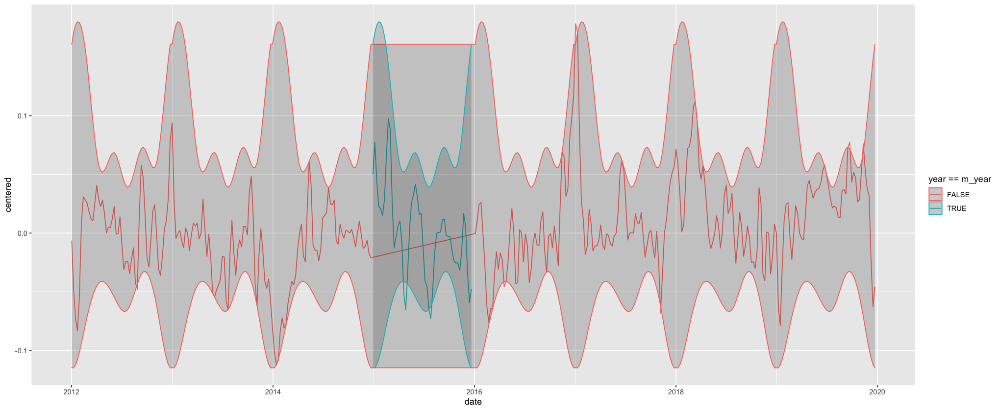

In [89]:
# example plot of out-of-sample fits
df = 18
m_year = 2015
df_idx = which(dfs == df)
year_idx = which(m_year == years)
te_hat[year_idx, df_idx] * 52
ggplot(subset(out[[year_idx]][[df_idx]], year(date) %in% c(year-1, year, year+1)), aes(date, centered, color=year == m_year)) + 
geom_line() +
geom_ribbon(aes(ymax=high, ymin=low), alpha=.2)

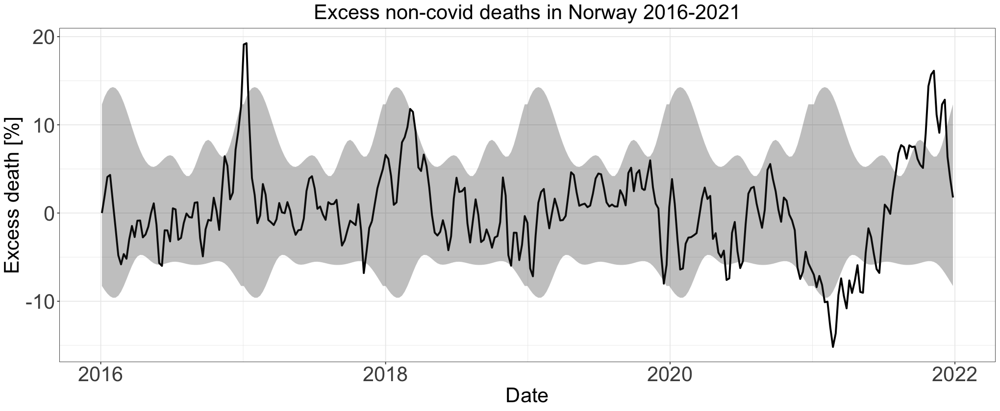

In [196]:
out = mortality_fit(old_norm, response="ln_non_cv_deaths", start_year=2008)
nc_all = out[[1]]

ggplot(subset(nc_all, year(date) >= 2016), aes(date, get_percentage(centered)) ) + 
geom_line(size=1.1) + 
geom_ribbon(aes(ymin=get_percentage(centered_low), ymax=get_percentage(centered_high)), alpha=0.3) +
theme_bw() +
labs(x = "Date", y = "Excess death [%]", title="Excess non-covid deaths in Norway 2016-2021") +
theme(plot.title=element_text(size=25, hjust=.5), axis.text=element_text(size=25), axis.title=element_text(size=25))

Warning message:
“Removed 155 row(s) containing missing values (geom_path).”
Warning message:
“Removed 155 row(s) containing missing values (geom_path).”


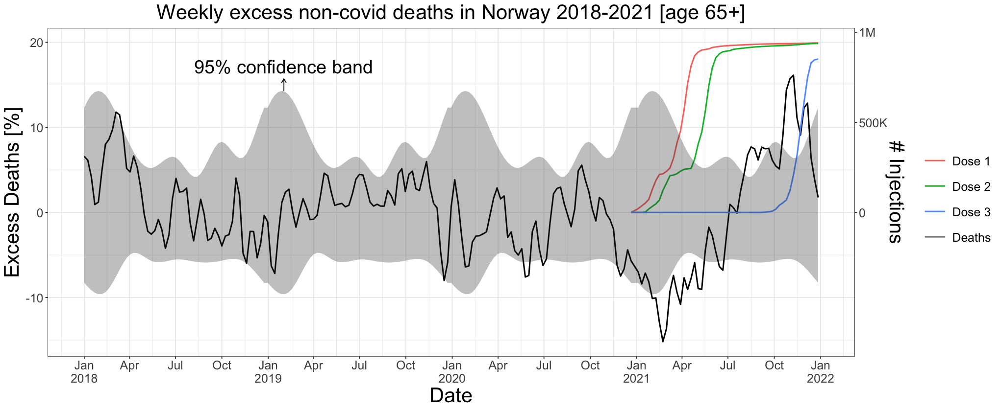

In [223]:
# Repeat analysis for non-covid deaths
options(repr.plot.width=17, repr.plot.height=7)
out = mortality_fit(old_norm, response="ln_non_cv_deaths", start_year=2008)
nc_all = out[[1]]
nc_all$p_centered = get_percentage(nc_all$centered)
nc_all$p_centered_low = get_percentage(nc_all$centered_low)
nc_all$p_centered_high = get_percentage(nc_all$centered_high)

# Plot
nc_all_vax = merge(nc_all, norm_vax, all.x=TRUE, by="date") %>% distinct()
max_p_cent_high = max(nc_all_vax$p_centered_high)

ggplot(subset(nc_all_vax, year(date) >= 2018), aes(date, p_centered)) + 
geom_line(aes(y=p_centered), size=0.85) + 
geom_line(aes(y=n_vax, color=n_dose), size=0.85) + 
scale_y_continuous(
        sec.axis=sec_axis(~. * max_vax / range[2], 
                      breaks=c(0, 5e5,1e6),
                    labels = scales::label_number_si(),
name="# Injections")) +
geom_ribbon(aes(ymin=p_centered_low, ymax=p_centered_high), alpha=0.3) +
labs(x = "Date", y = "Excess Deaths [%]", title="Weekly excess non-covid deaths in Norway 2018-2021 [age 65+]") +
theme_bw() +
theme(plot.title=element_text(size=25, hjust=.5), 
      axis.text=element_text(size=15), 
      legend.text=element_text(size=15), 
      axis.title=element_text(size=25), 
      legend.key.size=unit(1.1, "cm")) +
scale_color_discrete("", labels=c("Dose 1", "Dose 2", "Dose 3", "Deaths")) + 
annotate(
    geom = "curve", x = as.Date("2019-02-01"), y = max_p_cent_high, 
    xend = as.Date("2019-02-01"), yend = max_p_cent_high*1.1, 
    curvature = .01, arrow = arrow(length = unit(2, "mm"))
  ) +
  annotate(geom = "text", x = as.Date("2019-02-01"), y = max_p_cent_high*1.2, label = "95% confidence band", hjust = "center", size=8) +

scale_x_date(date_breaks = "3 months", labels = scales::label_date_short())
               
ggsave("../figures/norway_excess_nc_deaths_pois.pdf", width=17, height=8)

In [794]:
# Appendix B
# Fit using windowed weekly median instead with a window parameter related to effective degrees of freedom
# We see overall similar conclusions as far as the overage in 2021 and the two peaks in 2020 are concerned
tau_low = 0.05 # Quantile for high and low confidence bands
tau_high = 0.95
k = 3 # window size for rolling quantiles: MUST be odd 
options(repr.plot.width=12, repr.plot.height=7)
train = subset(old_norm,year(date) < 2020 & year(date) > 2010)
all = subset(old_norm,year(date) > 2010)
rq.fit = rq(deaths ~ days, data=train)

all$detrended = all$deaths - predict(rq.fit, newdata=all)
train$detrended = train$deaths - predict(rq.fit, newdata=train)


weeks_per_year = 52
weekly = data.frame(week=seq(1:52), med=rep(0, 52), high=rep(0, 52), low=rep(0, 52))
for (i in c(1:52)) {
    # This code organizes the indeces to be circular, -2,-1, 1, 2 etc
    a = c(0:(k - 1)) - floor(k / 2) + i
    a[a<=0] = a[a<=0] - 1
    a[a>=52] = a[a>=52] %% 52 + 1
    data = train$detrended[train$week %in% a]
    weekly$med[i] = median(data)
    weekly$high[i] = quantile(data, tau_high)
    weekly$low[i] = quantile(data, tau_low)
}
train = merge(train, weekly, by="week")
train$centered = train$detrended - train$med

for (i in c(1:52)) {
    a = c(0:(k - 1)) - floor(k / 2) + i
    a[a<=0] = a[a<=0] - 1
    a[a>=52] = a[a>=52] %% 52 + 1
    data = train$centered[train$week %in% a]
    weekly$high[i] = quantile(data, tau_high)
    weekly$low[i] = quantile(data, tau_low)
}

all = merge(all, weekly, by="week")
all$centered = all$detrended - all$med
all$centered_low = all$low
all$centered_high = all$high
head(all)

,week,date,deaths,days,detrended,med,high,low,centered,centered_low,centered_high
,<dbl>,<date>,<dbl>,<drtn>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,2011-01-03,20.45240,3661 days,3.678990,3.073593,2.443771,-2.088843,0.6053979,-2.088843,2.443771
2,1,2018-01-01,17.92849,6216 days,3.338571,3.073593,2.443771,-2.088843,0.2649784,-2.088843,2.443771
3,1,2021-01-04,15.82622,7315 days,2.175503,3.073593,2.443771,-2.088843,-0.8980901,-2.088843,2.443771
4,1,2014-12-29,18.72525,5117 days,3.196134,3.073593,2.443771,-2.088843,0.1225412,-2.088843,2.443771
5,1,2017-01-02,20.38842,5852 days,5.487429,3.073593,2.443771,-2.088843,2.4138364,-2.088843,2.443771
6,1,2016-01-04,17.42054,5488 days,2.208478,3.073593,2.443771,-2.088843,-0.8651142,-2.088843,2.443771


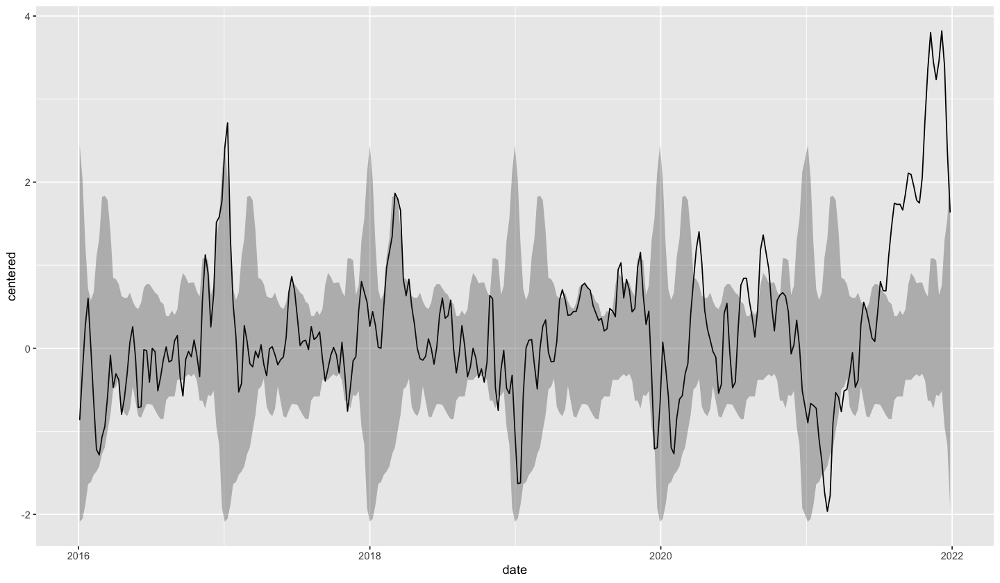

In [795]:
ggplot(subset(all, year(date) > 2015), aes(date, centered)) + geom_line() + 
geom_ribbon(aes(ymin=centered_low, ymax=centered_high), alpha=0.3)

In [811]:
age_groups = levels(merged$age)
merged$lnmu_detrended = merged$lnmu
merged$total_days = merged$date - merged$date[1]
cutoff_age = 25
older_age = 64
alpha = 0.0005
for (start_age in unique(merged$start_age[merged$start_age > cutoff_age])) {
    idx = merged$start_age == start_age & merged$year < 2020
    idx_all = merged$start_age == start_age
    age_data = merged[idx,]
    rq.fit = summary(rq(age_data$lnmu ~ age_data$total_days))
    if (dim(rq.fit$coef)[2] == 4) {
        significant = rq.fit$coef[2,4] < alpha
    } else {
        significant = rq.fit$coef[2,2] * rq.fit$coef[2,3] > 0
    }
    if (significant) {
        merged$lnmu_detrended[idx_all] = merged$lnmu[idx_all] - merged$total_days[idx_all] * rq.fit$coef[2,1]
    }
}

Warning message in rq.fit.br(x, y, tau = tau, ci = TRUE, ...):
“Solution may be nonunique”


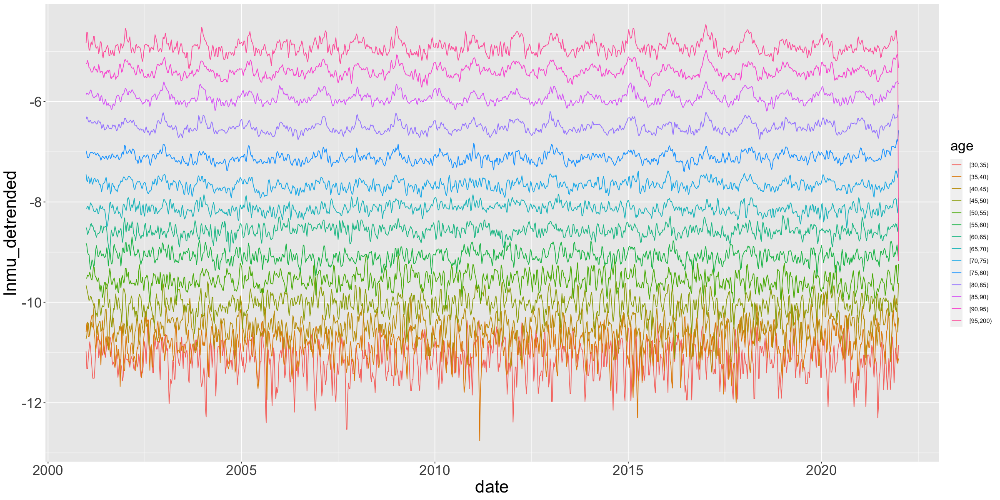

In [812]:
subset = subset(merged, start_age > cutoff_age)
options(repr.plot.width=20, repr.plot.height=10)
n_groups = length(esp_groups)
a = ggplot(subset, aes(x=date, y=lnmu_detrended, color=age))
a + geom_line() +
theme(title=element_text(size=20), axis.text=element_text(size=20), axis.title=element_text(size=25))

In [825]:
head(merged_sub)

year,age,week,death,date,pop,end_age,start_age,avg_age,sdeaths,pop.interp,mu,lnmu,lnmu_detrended,total_days
<dbl>,<fct>,<dbl>,<dbl>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<drtn>
2001,"[65,70)",1,39,2001-01-01,NA,69,65,67,49.75,168751.2,0.0002948127,-8.129170,-8.128744,7 days
2001,"[65,70)",2,59,2001-01-08,NA,69,65,67,51.75,168674.4,0.0003068041,-8.089301,-8.088448,14 days
2001,"[65,70)",3,50,2001-01-15,NA,69,65,67,51.25,168597.6,0.0003039783,-8.098554,-8.097274,21 days
2001,"[65,70)",4,46,2001-01-22,NA,69,65,67,48.00,168520.8,0.0002848314,-8.163613,-8.161906,28 days
2001,"[65,70)",5,50,2001-01-29,NA,69,65,67,51.25,168444.0,0.0003042555,-8.097643,-8.095509,35 days
2001,"[65,70)",6,59,2001-02-05,NA,69,65,67,55.25,168367.2,0.0003281519,-8.022034,-8.019474,42 days


In [833]:
merged_sub = subset(merged, year > 2000 & date !="2021-12-27" & start_age > 64)
y = merged_sub$lnmu

rq.fit = rq(lnmu ~ pbs(week, 6) + age*total_days, data=merged_sub)
rq.fit.high = rq(lnmu ~ pbs(week, 6) + age*total_days, data=merged_sub, tau=0.975)
rq.fit.low = rq(lnmu ~ pbs(week, 6) + age*total_days, data=merged_sub, tau=0.025)
summary(rq.fit.low)

Warning message in summary.rq(rq.fit.low):
“127 non-positive fis”



Call: rq(formula = lnmu ~ pbs(week, 6) + age * total_days, tau = 0.025, 
    data = merged_sub)

tau: [1] 0.025

Coefficients:
                       Value      Std. Error t value    Pr(>|t|)  
(Intercept)              -8.30880    0.02615 -317.77431    0.00000
pbs(week, 6)1            -0.09775    0.02414   -4.04967    0.00005
pbs(week, 6)2            -0.07812    0.01662   -4.69929    0.00000
pbs(week, 6)3            -0.07293    0.02568   -2.83985    0.00453
pbs(week, 6)4            -0.02720    0.02014   -1.35018    0.17700
pbs(week, 6)5             0.10791    0.01379    7.82644    0.00000
pbs(week, 6)6             0.07116    0.02191    3.24728    0.00117
age[70,75)                0.46639    0.02525   18.47358    0.00000
age[75,80)                1.04084    0.02727   38.16576    0.00000
age[80,85)                1.67199    0.02630   63.57997    0.00000
age[85,90)                2.25265    0.02416   93.22906    0.00000
age[90,95)                2.78466    0.02321  120.00130    0.00000
a

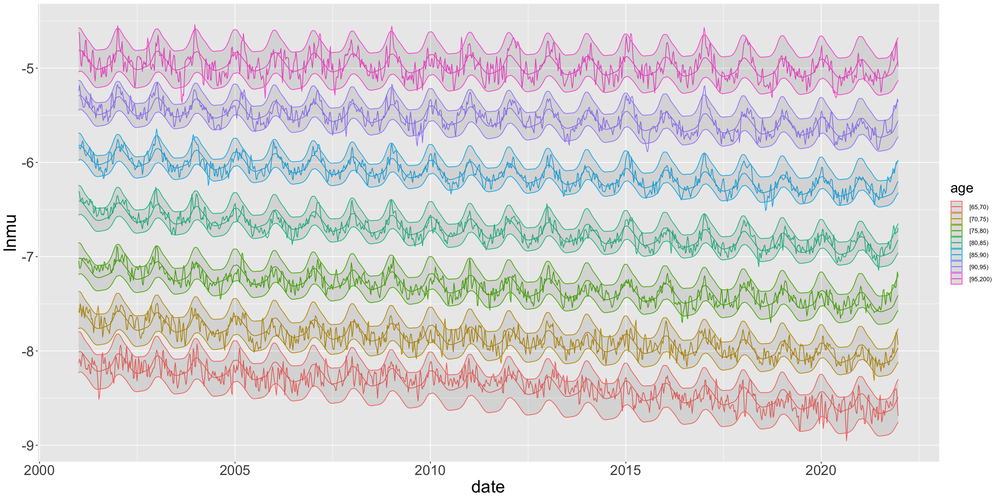

In [820]:
options(repr.plot.width=20, repr.plot.height=10)
n_groups = length(esp_groups)
a = ggplot(merged_sub, aes(x=date, y=lnmu, color=age))
a + geom_line() + geom_line(aes(x=date, y=rq.fit$fitted)) +
theme(title=element_text(size=20), axis.text=element_text(size=20), axis.title=element_text(size=25)) + 
geom_ribbon(aes(ymin=rq.fit.low$fitted, ymax=rq.fit.high$fitted), alpha=0.1)

In [823]:
# Even though the fit is fine, there is less precision because the model is not accurate.
# Specifically, ln(mortality rate) is not entirely linear wrt avg.age (See Gompertz plot above)
sum(merged_sub$lnmu > rq.fit.high$fitted) / dim(merged_sub)[1]
sum(merged_sub$lnmu < rq.fit.low$fitted) / dim(merged_sub)[1]

[1] 0.02566453

[1] 0.02553359

In [831]:
# An easier fit is to sum together mortality 
rq.means = rq(lnmu ~ age + age:total_days, data=merged_sub)
summary(rq.means)


Call: rq(formula = lnmu ~ age + age:total_days, data = merged_sub)

tau: [1] 0.5

Coefficients:
                       Value       Std. Error  t value     Pr(>|t|)   
(Intercept)               -8.12873     0.00808 -1006.18297     0.00000
age[70,75)                 0.47311     0.01268    37.30959     0.00000
age[75,80)                 1.00331     0.01068    93.98115     0.00000
age[80,85)                 1.59284     0.01038   153.51178     0.00000
age[85,90)                 2.18034     0.01191   183.12290     0.00000
age[90,95)                 2.72569     0.01060   257.12496     0.00000
age[95,200)                3.20905     0.01257   255.29233     0.00000
age[65,70):total_days     -0.00006     0.00000   -36.89295     0.00000
age[70,75):total_days     -0.00006     0.00000   -28.98269     0.00000
age[75,80):total_days     -0.00005     0.00000   -30.67534     0.00000
age[80,85):total_days     -0.00005     0.00000   -29.74179     0.00000
age[85,90):total_days     -0.00005     0.00000   -2

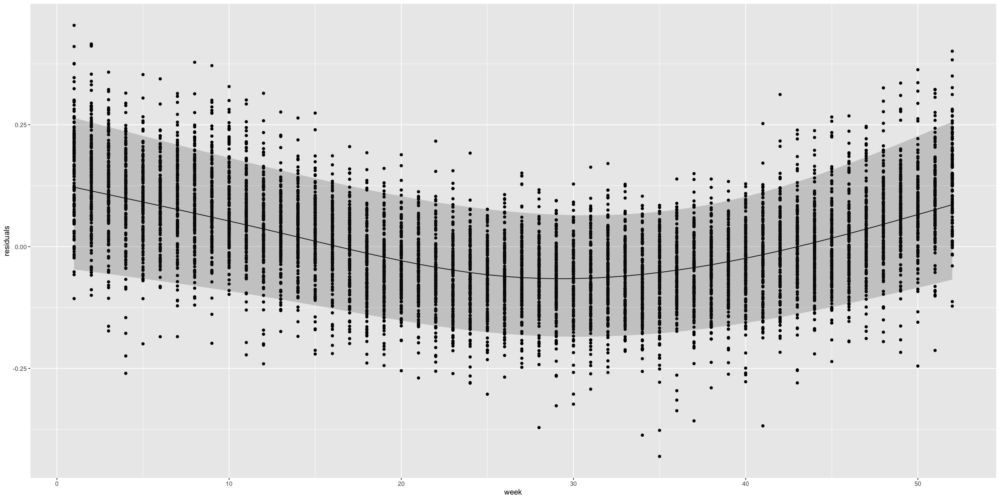

In [847]:
# Even though this type of fit has more datapoints, the weighting should be according to the ESP segmentation
rq.seasonal = rq(rq.means$res ~ ns(merged_sub$week, 4), tau=c(0.05, 0.5, 0.95), weights=merged_sub$pop.interp)
df = data.frame(week=merged_sub$week, residuals=rq.means$res) 
ggplot(df, aes(week, residuals)) + geom_point() + 
geom_line(aes(x=week, y=rq.seasonal$fit[,2])) +
geom_ribbon(aes(x=week, ymin=rq.seasonal$fit[,1], ymax=rq.seasonal$fit[,3]), alpha=0.2)

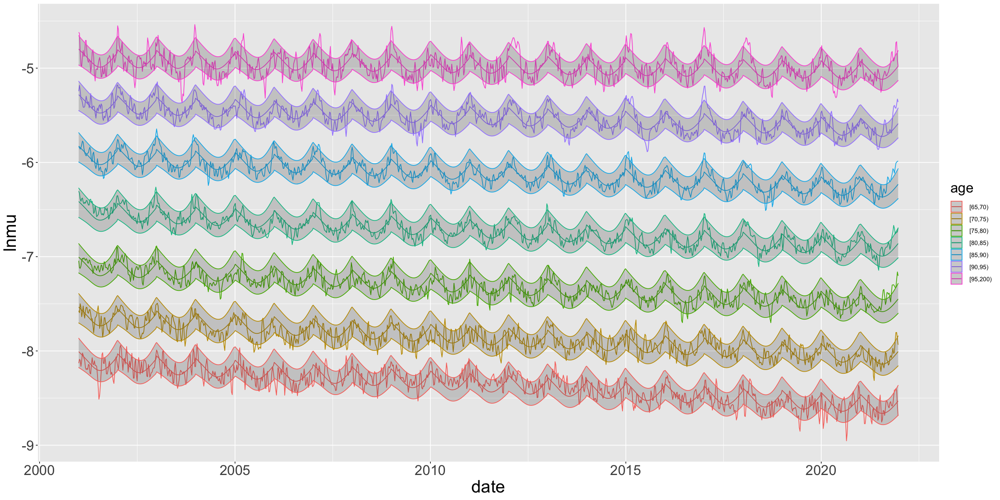

In [851]:
# Now we have something reasonable but if we are to sum according to EPS weights,
# combining the errors will be tricky as they are orders of magnitude different, and not really independent.
# So we leave it as is for now. It's still insightful to see an age-specific mortality.
options(repr.plot.width=20, repr.plot.height=10)
n_groups = length(esp_groups)
a = ggplot(merged_sub, aes(x=date, y=lnmu, color=age))
a + geom_line() + geom_line(aes(x=date, y=rq.means$fitted + rq.seasonal$fit[,2])) +
geom_ribbon(aes(x=date, ymin=rq.means$fit + rq.seasonal$fit[,1], 
                ymax=rq.means$fit + rq.seasonal$fit[,3]), alpha=0.2) +
theme(title=element_text(size=20), axis.text=element_text(size=20), axis.title=element_text(size=25))